In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
!unzip /content/drive/MyDrive/fire_dataaset.zip

Archive:  /content/drive/MyDrive/fire_dataaset.zip
  inflating: data/data/img_data/test/default/img_102.jpg  
  inflating: data/data/img_data/test/default/img_112.jpg  
  inflating: data/data/img_data/test/default/img_113.jpg  
  inflating: data/data/img_data/test/default/img_114.jpg  
  inflating: data/data/img_data/test/default/img_132.jpg  
  inflating: data/data/img_data/test/default/img_133.jpg  
  inflating: data/data/img_data/test/default/img_137.jpg  
  inflating: data/data/img_data/test/default/img_138.jpg  
  inflating: data/data/img_data/test/default/img_200.jpg  
  inflating: data/data/img_data/test/default/img_201.jpg  
  inflating: data/data/img_data/test/default/img_202.jpg  
  inflating: data/data/img_data/test/default/img_203.jpg  
  inflating: data/data/img_data/test/default/img_204.jpg  
  inflating: data/data/img_data/test/default/img_205.jpg  
  inflating: data/data/img_data/test/default/img_206.jpg  
  inflating: data/data/img_data/test/default/img_207.jpg  
  inf

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import class_weight
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

import tensorflow as tf
from tensorflow import keras

import cv2
import math
from IPython.display import clear_output

In [16]:
IMG_SIZE = 224
NUM_EPOCHS = 25
NUM_CLASSES = 3
TRAIN_BATCH_SIZE = 512
TEST_BATCH_SIZE = 1

In [18]:
def create_model():
    my_model = Sequential()
    resnet = ResNet50(include_top=False, pooling='avg', weights='imagenet')
    # resnet.summary()
    my_model.add(resnet)
    my_model.layers[0].trainable = False
    my_model.add(Dense(512, activation = 'gelu', kernel_regularizer = regularizers.L2(0.001)))
    my_model.add(Dense(NUM_CLASSES, activation='softmax'))

    optimizer = Adam(
    learning_rate=0.001,
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-07,
    amsgrad=False,
    weight_decay=None,
    clipnorm=None,
    clipvalue=None,
    global_clipnorm=None,
    use_ema=False,
    ema_momentum=0.99,
    ema_overwrite_frequency=None,
    jit_compile=True,
    name='Adam'
    )
    my_model.compile(optimizer = optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return my_model

In [19]:
def train_model(model):
    data_aug = ImageDataGenerator(preprocessing_function=preprocess_input,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    horizontal_flip=True,
                                    vertical_flip=False,
                                    data_format='channels_last',
                                    brightness_range=[0.5, 1.5])

    train_generator = data_aug.flow_from_directory(
          '/content/data/img_data/train',
          target_size=(IMG_SIZE, IMG_SIZE),
          batch_size=TRAIN_BATCH_SIZE,
          shuffle = True,
          class_mode='categorical')

    valid_generator = data_aug.flow_from_directory(
                  '/content/data/img_data/test',
                  target_size=(IMG_SIZE, IMG_SIZE),
                  batch_size=TEST_BATCH_SIZE,
                  shuffle = False,
                  class_mode='categorical')

    history = model.fit(
            train_generator,
            epochs=NUM_EPOCHS,
            validation_data=valid_generator,
            verbose=1,
        )

    return model, train_generator, valid_generator, history

model = create_model()
trained_model, train_generator, valid_generator, history = train_model(model)


94765736/94765736 [==============================] - 5s 0us/step
Found 693 images belonging to 3 classes.
Found 171 images belonging to 3 classes.
Epoch 1/25
2/2 [==============================] - 47s 28s/step - loss: 5.3459 - accuracy: 0.4185 - val_loss: 3.4035 - val_accuracy: 0.1287
Epoch 2/25
2/2 [==============================] - 16s 5s/step - loss: 2.1222 - accuracy: 0.6638 - val_loss: 3.3863 - val_accuracy: 0.5029
Epoch 3/25
2/2 [==============================] - 16s 13s/step - loss: 2.2773 - accuracy: 0.5599 - val_loss: 2.0138 - val_accuracy: 0.5380
Epoch 4/25
2/2 [==============================] - 16s 13s/step - loss: 1.2027 - accuracy: 0.8571 - val_loss: 2.6489 - val_accuracy: 0.2924
Epoch 5/25
2/2 [==============================] - 17s 12s/step - loss: 1.5291 - accuracy: 0.7547 - val_loss: 2.4098 - val_accuracy: 0.3918
Epoch 6/25
2/2 [==============================] - 16s 8s/step - loss: 1.3000 - accuracy: 0.8153 - val_loss: 1.6241 - val_accuracy: 0.6316
Epoch 7/25
2/2 [=====

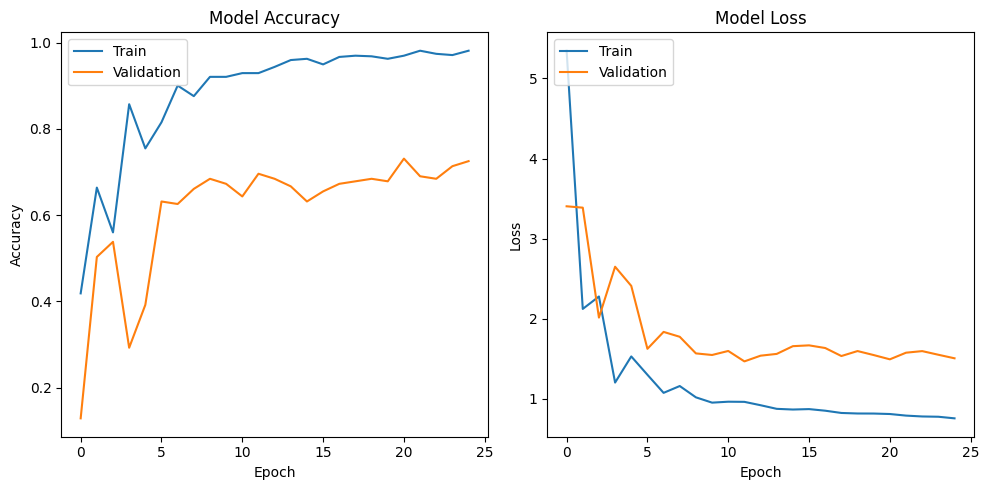

In [20]:
def plot_training_history(history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.show()

plot_training_history(history)

In [21]:
def draw_prediction( frame, class_string ):
    x_start = frame.shape[1] -600
    cv2.putText(frame, class_string, (x_start, 75), cv2.FONT_HERSHEY_SIMPLEX, 2.5, (255, 0, 0), 2, cv2.LINE_AA)
    return frame

def prepare_image_for_prediction( img):
    img = np.expand_dims(img, axis=0)
    return preprocess_input(img)

In [22]:
def get_label_dict(train_generator):
    labels = (train_generator.class_indices)
    label_dict = dict((v,k) for k,v in labels.items())
    return  label_dict

def get_labels(generator):
    generator.reset()
    labels = []
    for i in range(len(generator)):
        labels.extend(np.array(generator[i][1]) )
    return np.argmax(labels, axis =1)

def get_pred_labels(test_generator):
    test_generator.reset()
    pred_vec=model.predict_generator(test_generator,
                                     steps=test_generator.n,
                                     verbose=1)
    return np.argmax( pred_vec, axis = 1), np.max(pred_vec, axis = 1)

In [24]:
def get_display_string(pred_class, label_dict):
    txt = []
    for pc, confidence in pred_class:
        txt.append(f"{label_dict[pc]}: {confidence:.2f}")
    return ", ".join(txt)

In [ ]:
from google.colab.patches import cv2_imshow
def predicts(model, video_path, filename, label_dict):
    vs = cv2.VideoCapture(video_path)
    fps = math.floor(vs.get(cv2.CAP_PROP_FPS))
    ret_val = True
    writer = None

    while True:
        ret_val, frame = vs.read()
        if not ret_val:
            break

        resized_frame = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
        frame_for_pred = prepare_image_for_prediction(resized_frame)
        pred_vec = model.predict(frame_for_pred)

        pred_class = []
        confidence = np.round(pred_vec.max(), 2)

        if confidence > 0.4:
            pc = pred_vec.argmax()
            pred_class.append((pc, confidence))
        else:
            pred_class.append((0, 0))

        if pred_class:
            txt = get_display_string(pred_class, label_dict)
            frame = draw_prediction(frame, txt)

        if writer is None:
            fourcc = cv2.VideoWriter_fourcc(*"XVID")
            writer = cv2.VideoWriter(filename, fourcc, fps, (frame.shape[1], frame.shape[0]), True)

        writer.write(frame)
        cv2_imshow(frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):  # Press 'q' to exit
            break

    vs.release()
    writer.release()
    cv2.destroyAllWindows()

video_path = '/content/data/video_data/test_videos/test3.mp4'
label_dict = get_label_dict(train_generator)
predicts(model, video_path, 'test1_annotated.avi', label_dict)


In [ ]:
from moviepy.editor import *

path="/content/test1_annotated.avi"

clip=VideoFileClip(path)
clip.ipython_display(width=280)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t: 100%|█████████▉| 1165/1166 [00:17<00:00, 85.39it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/test1_annotated.avi, 2764800 bytes wanted but 0 bytes read,at frame 1165/1167, at time 46.60/46.64 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
!pip install mmdnn

In [ ]:
!mmdownload -f tensorflow -n resnet_v2_152 -o ./
!mmconvert -sf tensorflow -in imagenet_resnet_v2_152.ckpt.meta -iw imagenet_resnet_v2_152.ckpt --dstNodeName MMdnn_Output -df pytorch -om tf_resnet_to_pth.pth